# Mass — Buildings to Enriched Morphology & 3D Massing

**Library:** [`sitex`](../sitex) · **Original, fully-documented version:** [`01-ARCH-Building_Morphology.ipynb`](../documentations/01-ARCH-Building_Morphology.ipynb)

Thin, parameterized version of the Building Morphology workflow: Overture building
footprints in, an enriched GeoPackage (morphology + block + landuse + type +
estimated height/floors) and a 3D city mesh out. All the logic lives in
`sitex.arch.morphology` — this notebook is the parameters plus the calls that use them,
in the same order as the original: **morphology → tessellation → blocks →
landuse + classification → height/floor estimation → export → 3D massing.**

Land use is joined and buildings classified *before* height/floor estimation — a
landuse-polygon match overrides footprint-morphology classification, because in a
low-rise, semi-rural district a hospital or school footprint isn't reliably bigger or
more regular than an ordinary house.

## 1. Install & import

In [1]:
# One-time setup, if `sitex` isn't already installed in this kernel:
# %pip install "sitex[arch] @ git+https://github.com/ArchiColab/sitex.git"

import sys
from pathlib import Path

IN_COLAB = "google.colab" in sys.modules
print("Running in:", "Google Colab" if IN_COLAB else "Local environment")

if IN_COLAB:
    %pip install "sitex[arch] @ git+https://github.com/ArchiColab/sitex.git"

    from google.colab import drive
    drive.mount("/content/gdrive")

    DATA_DIR = Path("/content/gdrive/MyDrive/Colab_Outputs")
    OUTPUT_DIR = Path("/content/gdrive/MyDrive/SiteX_Outputs")

    if not (DATA_DIR / "overture").is_dir():
        raise FileNotFoundError(
            f"{DATA_DIR} not found (or incomplete) in your Google Drive. "
            "Before the workshop: download the workshop data zip and unzip it into "
            "My Drive/Colab_Outputs -- see the workshop setup instructions."
        )
else:
    DATA_DIR = Path("..") / "data"
    OUTPUT_DIR = Path("..") / "outputs"

DATA_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

from sitex.core.config import CityConfig
from sitex.arch import morphology as morph

## 2. Site configuration

`slug` is set explicitly here to match the filenames `00-Data-Overture_Extractor.ipynb`
already wrote to `data/overture/` (its own place-string slug, diacritics included) — the
same `CityConfig` then reuses that one slug for every output this notebook writes, so
inputs and outputs never drift apart the way they did across the original notebooks (see
the ARCH overview §5.5).

In [2]:
city = CityConfig(
    place_name="Phường Pleiku, Gia Lai, Vietnam",
    local_lat=13.9833,
    local_lon=108.0000,
    slug="phường_pleiku",  # matches the Overture extractor's own filename slug
    data_dir=DATA_DIR,
    output_dir=OUTPUT_DIR,
)

print(f"Local EPSG  : {city.local_epsg}")
print(f"CAD origin  : {city.origin}")

Local EPSG  : 32649
CAD origin  : (175000.0, 1547000.0)


## 3. Load buildings & streets, compute morphology

In [3]:
bldg = morph.load_buildings_for_city(city)
bldg = morph.compute_morphology(bldg)
print(f"{len(bldg):,} buildings, mean footprint area {bldg['area'].mean():.1f} m²")

streets, street_graph, main_nodes = morph.load_streets_for_city(city)
print(f"{len(streets):,} streets in the main connected component")

21,287 buildings, mean footprint area 151.1 m²
2,317 streets in the main connected component


## 4. Tessellation & street-enclosed blocks

Passing the real study-area `boundary` here matters: without it, the block-detection
limit falls back to the buildings' own convex hull, which can merge distinct blocks near
the AOI edge into one oversized enclosure once streets are clipped against a looser
limit — confirmed directly while migrating this notebook (a first pass that omitted the
boundary produced one block covering 30% of all buildings instead of ~370 real blocks).

In [4]:
boundary = morph.load_boundary_for_city(city)
tessellation, limit = morph.compute_tessellation(bldg, boundary=boundary)

blocks = morph.detect_blocks(streets, limit, city.local_epsg)
blocks = morph.compute_intersection_density(street_graph, main_nodes, blocks, city.local_epsg)
bldg = morph.join_block_to_buildings(bldg, blocks)

print(f"{len(blocks):,} blocks, {bldg['block_id'].nunique():,} containing at least one building")
print(f"Intersection density  mean: {blocks['int_density'].mean():.0f} / km²")

516 blocks, 374 containing at least one building
Intersection density  mean: 972 / km²


## 5. Land use join & building-type classification

Run before height/floor estimation, so the estimator (Section 6) has the resolved
building function available.

In [5]:
bldg = morph.join_landuse_for_city(bldg, city)
bldg = morph.classify_building_type(bldg)
print(bldg["bldg_type"].value_counts())

bldg_type
residential    20381
industrial       771
civic             85
mixed             50
Name: count, dtype: int64


## 6. Height & floor estimation

Fills only what's missing from Overture (`height`/`num_floors` are ~0% filled for this
AOI) with a seeded, rule-based estimate — plausible and reproducible, not measured.
Report `height_est`/`num_floors_est` as modelled in any downstream analysis.

**`HeightRules` below is tuned for Pleiku, not universal.** Every threshold — the
footprint-area brackets, the elongation/convexity cutoffs that separate a "row house"
from a "shophouse", the floor-count and height ranges themselves — was picked to match
this one semi-rural Vietnamese context. Before trusting `height_est`/`num_floors_est`
(and anything downstream of them: `volume_est`, the 3D mesh, UHI mass/volume inputs),
**check these numbers against real reference buildings for your own site** — satellite
or street-view spot checks, local building codes, or a field survey — and edit the
fields below to match. Don't reuse the Pleiku defaults for a different place.

In [6]:
# Pleiku-tuned defaults
# check and override. Edit any field to match your own site before trusting the result.
rules = morph.HeightRules(
    small_shed_area_max=40.0,       # below this footprint area: single-storey shed/hut
    small_shed_height=3.0,

    row_house_area_max=120.0,       # narrow "tube house" upper bound
    row_house_eri_min=0.6,          # elongation proxy threshold for "narrow"
    row_house_floors_range=(1, 3),
    row_house_height_range=(3.0, 9.0),

    small_house_floors_range=(2, 3),  # same area bracket, not elongated
    small_house_height_range=(6.0, 9.0),

    midsize_area_max=300.0,
    midsize_convexity_min=0.85,     # "regular" plan -> shophouse/larger house
    shophouse_floors_range=(2, 4),
    shophouse_height_range=(6.0, 12.0),
    irregular_floors_range=(2, 3),  # same area bracket, irregular plan
    irregular_height_range=(6.0, 9.0),

    public_area_max=800.0,          # school/clinic/public-building upper bound
    public_floors=2,
    public_height=8.0,

    warehouse_floors=1,             # above public_area_max: warehouse/large shed
    warehouse_height=6.0,
)

bldg = morph.estimate_floors_height(bldg, seed=42, rules=rules)
print(f"Floors est.  mean: {bldg['num_floors_est'].mean():.1f}")
print(f"Height est.  mean: {bldg['height_est'].mean():.1f} m")

Floors est.  mean: 1.9
Height est.  mean: 6.0 m


## 7. Preview building types

Interactive (folium), not a static `GeoDataFrame.plot()` — the latter has been observed
to crash the interpreter outright on some Windows/conda GDAL builds, independent of what
data is plotted; see `sitex.arch.morphology.plot_building_types`'s docstring.

In [7]:
morph.plot_building_types(bldg, center_lat=city.local_lat, center_lon=city.local_lon)

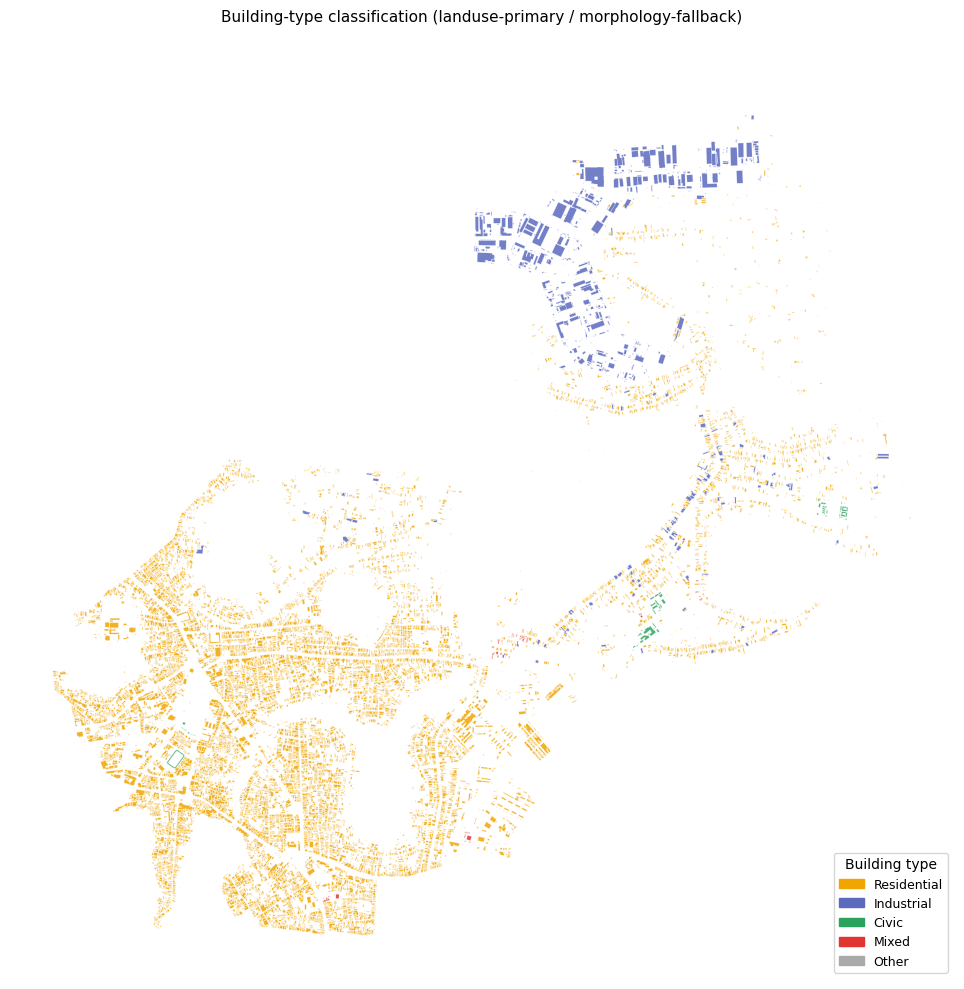

In [8]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── Map: building type ────────────────────────────────────────────────────
type_colors = {
    'residential': '#f0a500',
    'industrial':  '#5b6abf',
    'civic':       '#2ca25f',
    'mixed':       '#e03531',
    'other':       '#aaaaaa'  # Included fallback color in dictionary
}

bldg['_color'] = bldg['bldg_type'].map(type_colors).fillna('#aaaaaa')

fig, ax = plt.subplots(figsize=(10, 10))

# Plot all geometries in one pass using mapped colors
bldg.plot(ax=ax, color=bldg['_color'], edgecolor='white', linewidth=0.2, alpha=0.85)

# Explicitly create legend handles
legend_handles = [
    mpatches.Patch(color=color, label=btype.capitalize())
    for btype, color in type_colors.items()
]

ax.legend(
    handles=legend_handles, 
    title='Building type', 
    loc='lower right', 
    fontsize=9,
    title_fontsize=10,
    frameon=True
)

ax.set_title('Building-type classification (landuse-primary / morphology-fallback)', fontsize=11)
ax.set_axis_off()

plt.tight_layout()
plt.show()

## 8. Export enriched buildings

Two copies: true UTM coordinates (GIS) and shifted to the shared CAD/UCS origin
(`city.origin`) with CRS cleared — the same origin `01-ARCH-DEM_Contour.ipynb` uses, so
both land on one shared drawing origin in Revit/Rhino.

In [9]:
out_path = morph.export_enriched_buildings_for_city(bldg, city)
print(f"Enriched buildings (GIS)       → {out_path}")

local_path = morph.export_enriched_buildings_local_for_city(bldg, city)
print(f"Enriched buildings (CAD-local) → {local_path}")

Enriched buildings (GIS)       → ..\..\data\gdf\phường_pleiku_buildings_enriched.gpkg


c:\Users\Maddie\anaconda3\envs\gis\lib\site-packages\pyogrio\geopandas.py:710: UserWarning: 'crs' was not provided.  The output dataset will not have projection information defined and may not be usable in other systems.
  write(


Enriched buildings (CAD-local) → ..\..\data\gdf\phường_pleiku_buildings_enriched_local.gpkg


## 9. 3D massing

Samples the DEM at each footprint centroid for a real ground elevation (`base_z`), then
extrudes every footprint from `base_z` to `base_z + height_est` into one mesh, draped on
terrain — ready to import directly into Rhino.

In [10]:
bldg_local = morph.shift_to_local_origin(morph.select_export_columns(bldg), *city.origin)

mesh_path, base_z = morph.build_city_mesh_for_city(bldg, bldg_local, city)
print(f"City mesh (OBJ) → {mesh_path}")
print(f"Sampled base_z   min/mean/max: {base_z.min():.1f} / {base_z.mean():.1f} / {base_z.max():.1f} m")

geojson_path = morph.export_buildings_3d_geojson_for_city(bldg, base_z, city)
print(f"3D GeoJSON (web) → {geojson_path}")

City mesh (OBJ) → ..\..\outputs\phường_pleiku_city.obj
Sampled base_z   min/mean/max: 697.0 / 746.5 / 794.0 m
3D GeoJSON (web) → ..\..\outputs\phường_pleiku_buildings_3d.geojson


## 10. Export building footprints to DXF (for architects)

Two variants, both using the same `bldg_local`/`base_z` from Section 9, so they land on
the same CAD/UCS origin as everything else this notebook writes:

1. **Flat footprints at Z = 0** — plain 2D polylines, for site plans / figure-ground
   massing studies in plan view.
2. **Footprints on the DEM** — each footprint's ring placed at its own ground elevation
   (`base_z`), as flat 3D polylines. Checks footprints against sloped terrain; it does
   not extrude to roof height (that's the OBJ from Section 9).

Both are layered by `bldg_type` (`BLDG_RESIDENTIAL`, `BLDG_INDUSTRIAL`, ...) so a CAD
user can isolate/filter by use.

In [11]:
flat_dxf_path = morph.export_buildings_flat_dxf_for_city(bldg_local, city)
print(f"Flat footprints (Z=0) DXF → {flat_dxf_path}")

dem_dxf_path = morph.export_buildings_dem_dxf_for_city(bldg_local, base_z, city)
print(f"Footprints-on-DEM DXF    → {dem_dxf_path}")

Flat footprints (Z=0) DXF → ..\..\outputs\phường_pleiku_buildings_flat.dxf
Footprints-on-DEM DXF    → ..\..\outputs\phường_pleiku_buildings_dem.dxf


---
## Notes

- **`height_est`/`num_floors_est`/`bldg_type` are modelled, not measured** — see
  Sections 6 and the original notebook's own discussion before citing them in a thesis
  chapter.
- **Run `00-Data-Overture_Extractor.ipynb` first** — this notebook fails fast
  (`FileNotFoundError`) if the buildings/streets/landuse GeoPackages aren't already on
  disk under `data/overture/`.
- To model a new city: change only the `CityConfig` in Section 2, matching whatever slug
  the Overture extractor used for that place.